<h2> MOwNiT lab1 - Arytmetyka komputerowa </h2>



IEEE-754 Analysis http://babbage.cs.qc.cuny.edu/IEEE-754/

In [1]:
bitstring(Float32(1.0))

"00111111100000000000000000000000"

In [2]:
bitstring(Float64(1.0))

"0011111111110000000000000000000000000000000000000000000000000000"

In [3]:
# domyślnie Float64
bitstring(1.0)

"0011111111110000000000000000000000000000000000000000000000000000"

In [4]:
# Float16
bitstring(Float16(1.0))

"0011110000000000"

In [5]:
# znak, cecha, mantysa
#uwaga - w Julii tablice indeksujemy od 1
decode(x::Float32) = (b=bitstring(x); (b[1], b[2:9], b[10:32]))
decode(Float32(1.0))

('0', "01111111", "00000000000000000000000")

In [6]:
println(significand(Float32(1.0)), "*2^", exponent(Float32(1.0)))

1.0*2^0


In [7]:
# co ile liczby sa reprezentowane 
c=Float32[]
a=Float32(1.0)
r=1:10
for i=r
    push!(c, a)
    a=nextfloat(a)
end
map(x-> bitstring(x),c)

10-element Array{String,1}:
 "00111111100000000000000000000000"
 "00111111100000000000000000000001"
 "00111111100000000000000000000010"
 "00111111100000000000000000000011"
 "00111111100000000000000000000100"
 "00111111100000000000000000000101"
 "00111111100000000000000000000110"
 "00111111100000000000000000000111"
 "00111111100000000000000000001000"
 "00111111100000000000000000001001"

In [8]:
# Maszynowe epsilon mówi, jaki jest odstęp między kolejnymi liczbami zmiennoprzecinkowymi reprezentowanymi w komputerze
eps(Float32(1))

1.1920929f-7

In [9]:
eps(Float32)


1.1920929f-7

In [10]:
# Badanie postaci zdenormalizowanej. Co się dzieje, jak liczby są coraz mniejsze?
a=Float32(1.1)
for i=1:149
    a=a/Float32(2.0)
    println(decode(a), "  ", issubnormal(a))
end

('0', "01111110", "00011001100110011001101")  false
('0', "01111101", "00011001100110011001101")  false
('0', "01111100", "00011001100110011001101")  false
('0', "01111011", "00011001100110011001101")  false
('0', "01111010", "00011001100110011001101")  false
('0', "01111001", "00011001100110011001101")  false
('0', "01111000", "00011001100110011001101")  false
('0', "01110111", "00011001100110011001101")  false
('0', "01110110", "00011001100110011001101")  false
('0', "01110101", "00011001100110011001101")  false
('0', "01110100", "00011001100110011001101")  false
('0', "01110011", "00011001100110011001101")  false
('0', "01110010", "00011001100110011001101")  false
('0', "01110001", "00011001100110011001101")  false
('0', "01110000", "00011001100110011001101")  false
('0', "01101111", "00011001100110011001101")  false
('0', "01101110", "00011001100110011001101")  false
('0', "01101101", "00011001100110011001101")  false
('0', "01101100", "00011001100110011001101")  false
('0', "01101

In [11]:
#Pkg.add("Plots")
# http://docs.juliaplots.org/latest/tutorial/
using Plots

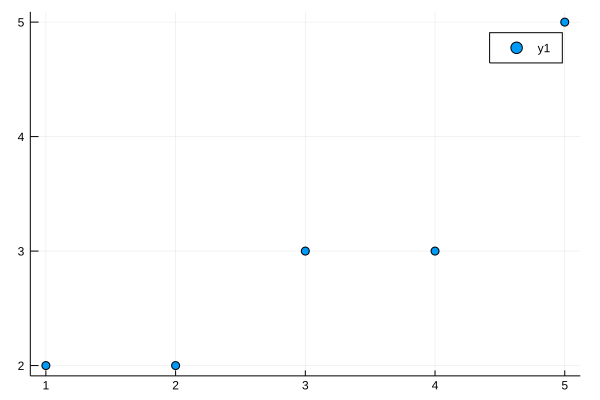

In [12]:
scatter(1:1:5, [2,2,3,3,5])

<b> Zadanie 1 </b>  Porównać w języku Julia reprezentację bitową liczby 1/3 dla Float32, Float64 oraz liczby, 
która jest inicjalizowana jako Float32, a potem rzutowana na Float64.

In [1]:
a = 1/3
bitstring(Float32(a))

"00111110101010101010101010101011"

In [16]:
b = 1/3
bitstring(Float64(b))

"0011111111010101010101010101010101010101010101010101010101010101"

In [20]:
c = Float32(1/3)
bitstring(Float64(c))

"0011111111010101010101010101010101100000000000000000000000000000"

<b>Zadanie 2</b> Zbadać, jak zmienia się odległość między kolejnymi liczbami zminnoprzecinkowymi 
reprezentowanymi w komputerze za pomocą języka Julia. 
Narysować wykres używając Plots zależności odległości od wartości liczby dla zakresu  od 1.0 do 1000.0 z krokiem 1.0.

In [1]:
tab = Float64[]
a = Float64(1.0)
b = Float64(1000.0)
for i = a : b
    push!(tab, nextfloat(a) - a)
    a = a + Float64(1.0)
end
map(x -> x, tab)

1000-element Array{Float64,1}:
 2.220446049250313e-16 
 4.440892098500626e-16 
 4.440892098500626e-16 
 8.881784197001252e-16 
 8.881784197001252e-16 
 8.881784197001252e-16 
 8.881784197001252e-16 
 1.7763568394002505e-15
 1.7763568394002505e-15
 1.7763568394002505e-15
 1.7763568394002505e-15
 1.7763568394002505e-15
 1.7763568394002505e-15
 ⋮                     
 1.1368683772161603e-13
 1.1368683772161603e-13
 1.1368683772161603e-13
 1.1368683772161603e-13
 1.1368683772161603e-13
 1.1368683772161603e-13
 1.1368683772161603e-13
 1.1368683772161603e-13
 1.1368683772161603e-13
 1.1368683772161603e-13
 1.1368683772161603e-13
 1.1368683772161603e-13

In [2]:
using Plots

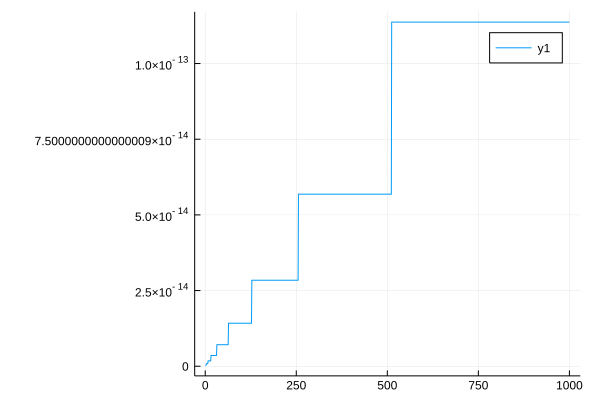

In [3]:
plot(1:1:1000, tab)

<b>Zadanie 3</b> Jedną z bibliotek numerycznych, jaką będziemy używać na zajęciach jest <a href="http://home.agh.edu.pl/~kzajac/dydakt/mownit/lab1/gsl.html">GSL</a> (język C). Korzystając ze <a href="https://www.gnu.org/software/gsl/doc/html/ieee754.html"> wsparcia dla wyświetlania reprezentacji liczb zmiennoprzecinkowych</a> zobaczyć jak zmienia się cecha i mantysa dla coraz mniejszych liczb. Zaobserwować, kiedy matysa przestaje być znormalizowana i dlaczego?

In [17]:
#include <stdio.h>
#include <gsl/gsl_math.h>
#include <gsl/gsl_ieee_utils.h>

int main(void){

    float f = 1.0;
    double d = 1.0;

    for(int i = 0; i < 1025; i++){
    
        double fd = f;
    
        printf ("float = ");
        gsl_ieee_printf_float(&f);
        printf ("\n");
    
        printf ("float_to_double = "); 
        gsl_ieee_printf_double(&fd);
        printf ("\n");

        printf ("double = "); 
        gsl_ieee_printf_double(&d);
        printf ("\n \n");
    
        f = f/2.0;
        d = d/2.0;
    }

    return 0;
}

LoadError: syntax: missing comma or } in argument list

In [ ]:
Float zmienia się przy 127 iteracji, float_to_double zmienia się przy 150 iteracji, a double przy 1023 iteracji.


0 iteration: 
float =  1.00000000000000000000000*2^0
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^0
double =  1.0000000000000000000000000000000000000000000000000000*2^0
 
1 iteration: 
float =  1.00000000000000000000000*2^-1
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-1
double =  1.0000000000000000000000000000000000000000000000000000*2^-1
 
2 iteration: 
float =  1.00000000000000000000000*2^-2
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-2
double =  1.0000000000000000000000000000000000000000000000000000*2^-2
 
3 iteration: 
float =  1.00000000000000000000000*2^-3
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-3
double =  1.0000000000000000000000000000000000000000000000000000*2^-3
 
4 iteration: 
float =  1.00000000000000000000000*2^-4
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-4
double =  1.0000000000000000000000000000000000000000000000000000*2^-4
 
5 iteration: 
float =  1.00000000000000000000000*2^-5
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-5
double =  1.0000000000000000000000000000000000000000000000000000*2^-5
 
6 iteration: 
float =  1.00000000000000000000000*2^-6
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-6
double =  1.0000000000000000000000000000000000000000000000000000*2^-6
 
7 iteration: 
float =  1.00000000000000000000000*2^-7
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-7
double =  1.0000000000000000000000000000000000000000000000000000*2^-7
 
8 iteration: 
float =  1.00000000000000000000000*2^-8
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-8
double =  1.0000000000000000000000000000000000000000000000000000*2^-8
 
9 iteration: 
float =  1.00000000000000000000000*2^-9
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-9
double =  1.0000000000000000000000000000000000000000000000000000*2^-9
 
10 iteration: 
float =  1.00000000000000000000000*2^-10
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-10
double =  1.0000000000000000000000000000000000000000000000000000*2^-10
 
11 iteration: 
float =  1.00000000000000000000000*2^-11
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-11
double =  1.0000000000000000000000000000000000000000000000000000*2^-11
 
12 iteration: 
float =  1.00000000000000000000000*2^-12
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-12
double =  1.0000000000000000000000000000000000000000000000000000*2^-12
 
13 iteration: 
float =  1.00000000000000000000000*2^-13
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-13
double =  1.0000000000000000000000000000000000000000000000000000*2^-13
 
14 iteration: 
float =  1.00000000000000000000000*2^-14
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-14
double =  1.0000000000000000000000000000000000000000000000000000*2^-14
 
15 iteration: 
float =  1.00000000000000000000000*2^-15
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-15
double =  1.0000000000000000000000000000000000000000000000000000*2^-15
 
16 iteration: 
float =  1.00000000000000000000000*2^-16
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-16
double =  1.0000000000000000000000000000000000000000000000000000*2^-16
 
17 iteration: 
float =  1.00000000000000000000000*2^-17
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-17
double =  1.0000000000000000000000000000000000000000000000000000*2^-17
 
18 iteration: 
float =  1.00000000000000000000000*2^-18
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-18
double =  1.0000000000000000000000000000000000000000000000000000*2^-18
 
19 iteration: 
float =  1.00000000000000000000000*2^-19
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-19
double =  1.0000000000000000000000000000000000000000000000000000*2^-19
 
20 iteration: 
float =  1.00000000000000000000000*2^-20
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-20
double =  1.0000000000000000000000000000000000000000000000000000*2^-20
 
21 iteration: 
float =  1.00000000000000000000000*2^-21
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-21
double =  1.0000000000000000000000000000000000000000000000000000*2^-21
 
22 iteration: 
float =  1.00000000000000000000000*2^-22
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-22
double =  1.0000000000000000000000000000000000000000000000000000*2^-22
 
23 iteration: 
float =  1.00000000000000000000000*2^-23
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-23
double =  1.0000000000000000000000000000000000000000000000000000*2^-23
 
24 iteration: 
float =  1.00000000000000000000000*2^-24
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-24
double =  1.0000000000000000000000000000000000000000000000000000*2^-24
 
25 iteration: 
float =  1.00000000000000000000000*2^-25
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-25
double =  1.0000000000000000000000000000000000000000000000000000*2^-25
 
26 iteration: 
float =  1.00000000000000000000000*2^-26
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-26
double =  1.0000000000000000000000000000000000000000000000000000*2^-26
 
27 iteration: 
float =  1.00000000000000000000000*2^-27
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-27
double =  1.0000000000000000000000000000000000000000000000000000*2^-27
 
28 iteration: 
float =  1.00000000000000000000000*2^-28
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-28
double =  1.0000000000000000000000000000000000000000000000000000*2^-28
 
29 iteration: 
float =  1.00000000000000000000000*2^-29
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-29
double =  1.0000000000000000000000000000000000000000000000000000*2^-29
 
30 iteration: 
float =  1.00000000000000000000000*2^-30
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-30
double =  1.0000000000000000000000000000000000000000000000000000*2^-30
 
31 iteration: 
float =  1.00000000000000000000000*2^-31
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-31
double =  1.0000000000000000000000000000000000000000000000000000*2^-31
 
32 iteration: 
float =  1.00000000000000000000000*2^-32
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-32
double =  1.0000000000000000000000000000000000000000000000000000*2^-32
 
33 iteration: 
float =  1.00000000000000000000000*2^-33
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-33
double =  1.0000000000000000000000000000000000000000000000000000*2^-33
 
34 iteration: 
float =  1.00000000000000000000000*2^-34
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-34
double =  1.0000000000000000000000000000000000000000000000000000*2^-34
 
35 iteration: 
float =  1.00000000000000000000000*2^-35
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-35
double =  1.0000000000000000000000000000000000000000000000000000*2^-35
 
36 iteration: 
float =  1.00000000000000000000000*2^-36
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-36
double =  1.0000000000000000000000000000000000000000000000000000*2^-36
 
37 iteration: 
float =  1.00000000000000000000000*2^-37
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-37
double =  1.0000000000000000000000000000000000000000000000000000*2^-37
 
38 iteration: 
float =  1.00000000000000000000000*2^-38
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-38
double =  1.0000000000000000000000000000000000000000000000000000*2^-38
 
39 iteration: 
float =  1.00000000000000000000000*2^-39
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-39
double =  1.0000000000000000000000000000000000000000000000000000*2^-39
 
40 iteration: 
float =  1.00000000000000000000000*2^-40
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-40
double =  1.0000000000000000000000000000000000000000000000000000*2^-40
 
41 iteration: 
float =  1.00000000000000000000000*2^-41
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-41
double =  1.0000000000000000000000000000000000000000000000000000*2^-41
 
42 iteration: 
float =  1.00000000000000000000000*2^-42
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-42
double =  1.0000000000000000000000000000000000000000000000000000*2^-42
 
43 iteration: 
float =  1.00000000000000000000000*2^-43
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-43
double =  1.0000000000000000000000000000000000000000000000000000*2^-43
 
44 iteration: 
float =  1.00000000000000000000000*2^-44
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-44
double =  1.0000000000000000000000000000000000000000000000000000*2^-44
 
45 iteration: 
float =  1.00000000000000000000000*2^-45
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-45
double =  1.0000000000000000000000000000000000000000000000000000*2^-45
 
46 iteration: 
float =  1.00000000000000000000000*2^-46
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-46
double =  1.0000000000000000000000000000000000000000000000000000*2^-46
 
47 iteration: 
float =  1.00000000000000000000000*2^-47
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-47
double =  1.0000000000000000000000000000000000000000000000000000*2^-47
 
48 iteration: 
float =  1.00000000000000000000000*2^-48
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-48
double =  1.0000000000000000000000000000000000000000000000000000*2^-48
 
49 iteration: 
float =  1.00000000000000000000000*2^-49
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-49
double =  1.0000000000000000000000000000000000000000000000000000*2^-49
 
50 iteration: 
float =  1.00000000000000000000000*2^-50
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-50
double =  1.0000000000000000000000000000000000000000000000000000*2^-50
 
51 iteration: 
float =  1.00000000000000000000000*2^-51
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-51
double =  1.0000000000000000000000000000000000000000000000000000*2^-51
 
52 iteration: 
float =  1.00000000000000000000000*2^-52
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-52
double =  1.0000000000000000000000000000000000000000000000000000*2^-52
 
53 iteration: 
float =  1.00000000000000000000000*2^-53
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-53
double =  1.0000000000000000000000000000000000000000000000000000*2^-53
 
54 iteration: 
float =  1.00000000000000000000000*2^-54
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-54
double =  1.0000000000000000000000000000000000000000000000000000*2^-54
 
55 iteration: 
float =  1.00000000000000000000000*2^-55
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-55
double =  1.0000000000000000000000000000000000000000000000000000*2^-55
 
56 iteration: 
float =  1.00000000000000000000000*2^-56
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-56
double =  1.0000000000000000000000000000000000000000000000000000*2^-56
 
57 iteration: 
float =  1.00000000000000000000000*2^-57
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-57
double =  1.0000000000000000000000000000000000000000000000000000*2^-57
 
58 iteration: 
float =  1.00000000000000000000000*2^-58
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-58
double =  1.0000000000000000000000000000000000000000000000000000*2^-58
 
59 iteration: 
float =  1.00000000000000000000000*2^-59
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-59
double =  1.0000000000000000000000000000000000000000000000000000*2^-59
 
60 iteration: 
float =  1.00000000000000000000000*2^-60
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-60
double =  1.0000000000000000000000000000000000000000000000000000*2^-60
 
61 iteration: 
float =  1.00000000000000000000000*2^-61
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-61
double =  1.0000000000000000000000000000000000000000000000000000*2^-61
 
62 iteration: 
float =  1.00000000000000000000000*2^-62
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-62
double =  1.0000000000000000000000000000000000000000000000000000*2^-62
 
63 iteration: 
float =  1.00000000000000000000000*2^-63
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-63
double =  1.0000000000000000000000000000000000000000000000000000*2^-63
 
64 iteration: 
float =  1.00000000000000000000000*2^-64
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-64
double =  1.0000000000000000000000000000000000000000000000000000*2^-64
 
65 iteration: 
float =  1.00000000000000000000000*2^-65
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-65
double =  1.0000000000000000000000000000000000000000000000000000*2^-65
 
66 iteration: 
float =  1.00000000000000000000000*2^-66
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-66
double =  1.0000000000000000000000000000000000000000000000000000*2^-66
 
67 iteration: 
float =  1.00000000000000000000000*2^-67
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-67
double =  1.0000000000000000000000000000000000000000000000000000*2^-67
 
68 iteration: 
float =  1.00000000000000000000000*2^-68
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-68
double =  1.0000000000000000000000000000000000000000000000000000*2^-68
 
69 iteration: 
float =  1.00000000000000000000000*2^-69
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-69
double =  1.0000000000000000000000000000000000000000000000000000*2^-69
 
70 iteration: 
float =  1.00000000000000000000000*2^-70
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-70
double =  1.0000000000000000000000000000000000000000000000000000*2^-70
 
71 iteration: 
float =  1.00000000000000000000000*2^-71
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-71
double =  1.0000000000000000000000000000000000000000000000000000*2^-71
 
72 iteration: 
float =  1.00000000000000000000000*2^-72
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-72
double =  1.0000000000000000000000000000000000000000000000000000*2^-72
 
73 iteration: 
float =  1.00000000000000000000000*2^-73
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-73
double =  1.0000000000000000000000000000000000000000000000000000*2^-73
 
74 iteration: 
float =  1.00000000000000000000000*2^-74
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-74
double =  1.0000000000000000000000000000000000000000000000000000*2^-74
 
75 iteration: 
float =  1.00000000000000000000000*2^-75
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-75
double =  1.0000000000000000000000000000000000000000000000000000*2^-75
 
76 iteration: 
float =  1.00000000000000000000000*2^-76
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-76
double =  1.0000000000000000000000000000000000000000000000000000*2^-76
 
77 iteration: 
float =  1.00000000000000000000000*2^-77
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-77
double =  1.0000000000000000000000000000000000000000000000000000*2^-77
 
78 iteration: 
float =  1.00000000000000000000000*2^-78
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-78
double =  1.0000000000000000000000000000000000000000000000000000*2^-78
 
79 iteration: 
float =  1.00000000000000000000000*2^-79
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-79
double =  1.0000000000000000000000000000000000000000000000000000*2^-79
 
80 iteration: 
float =  1.00000000000000000000000*2^-80
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-80
double =  1.0000000000000000000000000000000000000000000000000000*2^-80
 
81 iteration: 
float =  1.00000000000000000000000*2^-81
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-81
double =  1.0000000000000000000000000000000000000000000000000000*2^-81
 
82 iteration: 
float =  1.00000000000000000000000*2^-82
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-82
double =  1.0000000000000000000000000000000000000000000000000000*2^-82
 
83 iteration: 
float =  1.00000000000000000000000*2^-83
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-83
double =  1.0000000000000000000000000000000000000000000000000000*2^-83
 
84 iteration: 
float =  1.00000000000000000000000*2^-84
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-84
double =  1.0000000000000000000000000000000000000000000000000000*2^-84
 
85 iteration: 
float =  1.00000000000000000000000*2^-85
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-85
double =  1.0000000000000000000000000000000000000000000000000000*2^-85
 
86 iteration: 
float =  1.00000000000000000000000*2^-86
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-86
double =  1.0000000000000000000000000000000000000000000000000000*2^-86
 
87 iteration: 
float =  1.00000000000000000000000*2^-87
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-87
double =  1.0000000000000000000000000000000000000000000000000000*2^-87
 
88 iteration: 
float =  1.00000000000000000000000*2^-88
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-88
double =  1.0000000000000000000000000000000000000000000000000000*2^-88
 
89 iteration: 
float =  1.00000000000000000000000*2^-89
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-89
double =  1.0000000000000000000000000000000000000000000000000000*2^-89
 
90 iteration: 
float =  1.00000000000000000000000*2^-90
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-90
double =  1.0000000000000000000000000000000000000000000000000000*2^-90
 
91 iteration: 
float =  1.00000000000000000000000*2^-91
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-91
double =  1.0000000000000000000000000000000000000000000000000000*2^-91
 
92 iteration: 
float =  1.00000000000000000000000*2^-92
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-92
double =  1.0000000000000000000000000000000000000000000000000000*2^-92
 
93 iteration: 
float =  1.00000000000000000000000*2^-93
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-93
double =  1.0000000000000000000000000000000000000000000000000000*2^-93
 
94 iteration: 
float =  1.00000000000000000000000*2^-94
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-94
double =  1.0000000000000000000000000000000000000000000000000000*2^-94
 
95 iteration: 
float =  1.00000000000000000000000*2^-95
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-95
double =  1.0000000000000000000000000000000000000000000000000000*2^-95
 
96 iteration: 
float =  1.00000000000000000000000*2^-96
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-96
double =  1.0000000000000000000000000000000000000000000000000000*2^-96
 
97 iteration: 
float =  1.00000000000000000000000*2^-97
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-97
double =  1.0000000000000000000000000000000000000000000000000000*2^-97
 
98 iteration: 
float =  1.00000000000000000000000*2^-98
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-98
double =  1.0000000000000000000000000000000000000000000000000000*2^-98
 
99 iteration: 
float =  1.00000000000000000000000*2^-99
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-99
double =  1.0000000000000000000000000000000000000000000000000000*2^-99
 
100 iteration: 
float =  1.00000000000000000000000*2^-100
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-100
double =  1.0000000000000000000000000000000000000000000000000000*2^-100
 
101 iteration: 
float =  1.00000000000000000000000*2^-101
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-101
double =  1.0000000000000000000000000000000000000000000000000000*2^-101
 
102 iteration: 
float =  1.00000000000000000000000*2^-102
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-102
double =  1.0000000000000000000000000000000000000000000000000000*2^-102
 
103 iteration: 
float =  1.00000000000000000000000*2^-103
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-103
double =  1.0000000000000000000000000000000000000000000000000000*2^-103
 
104 iteration: 
float =  1.00000000000000000000000*2^-104
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-104
double =  1.0000000000000000000000000000000000000000000000000000*2^-104
 
105 iteration: 
float =  1.00000000000000000000000*2^-105
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-105
double =  1.0000000000000000000000000000000000000000000000000000*2^-105
 
106 iteration: 
float =  1.00000000000000000000000*2^-106
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-106
double =  1.0000000000000000000000000000000000000000000000000000*2^-106
 
107 iteration: 
float =  1.00000000000000000000000*2^-107
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-107
double =  1.0000000000000000000000000000000000000000000000000000*2^-107
 
108 iteration: 
float =  1.00000000000000000000000*2^-108
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-108
double =  1.0000000000000000000000000000000000000000000000000000*2^-108
 
109 iteration: 
float =  1.00000000000000000000000*2^-109
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-109
double =  1.0000000000000000000000000000000000000000000000000000*2^-109
 
110 iteration: 
float =  1.00000000000000000000000*2^-110
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-110
double =  1.0000000000000000000000000000000000000000000000000000*2^-110
 
111 iteration: 
float =  1.00000000000000000000000*2^-111
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-111
double =  1.0000000000000000000000000000000000000000000000000000*2^-111
 
112 iteration: 
float =  1.00000000000000000000000*2^-112
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-112
double =  1.0000000000000000000000000000000000000000000000000000*2^-112
 
113 iteration: 
float =  1.00000000000000000000000*2^-113
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-113
double =  1.0000000000000000000000000000000000000000000000000000*2^-113
 
114 iteration: 
float =  1.00000000000000000000000*2^-114
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-114
double =  1.0000000000000000000000000000000000000000000000000000*2^-114
 
115 iteration: 
float =  1.00000000000000000000000*2^-115
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-115
double =  1.0000000000000000000000000000000000000000000000000000*2^-115
 
116 iteration: 
float =  1.00000000000000000000000*2^-116
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-116
double =  1.0000000000000000000000000000000000000000000000000000*2^-116
 
117 iteration: 
float =  1.00000000000000000000000*2^-117
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-117
double =  1.0000000000000000000000000000000000000000000000000000*2^-117
 
118 iteration: 
float =  1.00000000000000000000000*2^-118
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-118
double =  1.0000000000000000000000000000000000000000000000000000*2^-118
 
119 iteration: 
float =  1.00000000000000000000000*2^-119
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-119
double =  1.0000000000000000000000000000000000000000000000000000*2^-119
 
120 iteration: 
float =  1.00000000000000000000000*2^-120
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-120
double =  1.0000000000000000000000000000000000000000000000000000*2^-120
 
121 iteration: 
float =  1.00000000000000000000000*2^-121
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-121
double =  1.0000000000000000000000000000000000000000000000000000*2^-121
 
122 iteration: 
float =  1.00000000000000000000000*2^-122
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-122
double =  1.0000000000000000000000000000000000000000000000000000*2^-122
 
123 iteration: 
float =  1.00000000000000000000000*2^-123
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-123
double =  1.0000000000000000000000000000000000000000000000000000*2^-123
 
124 iteration: 
float =  1.00000000000000000000000*2^-124
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-124
double =  1.0000000000000000000000000000000000000000000000000000*2^-124
 
125 iteration: 
float =  1.00000000000000000000000*2^-125
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-125
double =  1.0000000000000000000000000000000000000000000000000000*2^-125
 
126 iteration: 
float =  1.00000000000000000000000*2^-126
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-126
double =  1.0000000000000000000000000000000000000000000000000000*2^-126
 
127 iteration: 
float =  0.10000000000000000000000*2^-126
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-127
double =  1.0000000000000000000000000000000000000000000000000000*2^-127
 
128 iteration: 
float =  0.01000000000000000000000*2^-126
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-128
double =  1.0000000000000000000000000000000000000000000000000000*2^-128
 
129 iteration: 
float =  0.00100000000000000000000*2^-126
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-129
double =  1.0000000000000000000000000000000000000000000000000000*2^-129
 
130 iteration: 
float =  0.00010000000000000000000*2^-126
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-130
double =  1.0000000000000000000000000000000000000000000000000000*2^-130
 
131 iteration: 
float =  0.00001000000000000000000*2^-126
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-131
double =  1.0000000000000000000000000000000000000000000000000000*2^-131
 
132 iteration: 
float =  0.00000100000000000000000*2^-126
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-132
double =  1.0000000000000000000000000000000000000000000000000000*2^-132
 
133 iteration: 
float =  0.00000010000000000000000*2^-126
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-133
double =  1.0000000000000000000000000000000000000000000000000000*2^-133
 
134 iteration: 
float =  0.00000001000000000000000*2^-126
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-134
double =  1.0000000000000000000000000000000000000000000000000000*2^-134
 
135 iteration: 
float =  0.00000000100000000000000*2^-126
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-135
double =  1.0000000000000000000000000000000000000000000000000000*2^-135
 
136 iteration: 
float =  0.00000000010000000000000*2^-126
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-136
double =  1.0000000000000000000000000000000000000000000000000000*2^-136
 
137 iteration: 
float =  0.00000000001000000000000*2^-126
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-137
double =  1.0000000000000000000000000000000000000000000000000000*2^-137
 
138 iteration: 
float =  0.00000000000100000000000*2^-126
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-138
double =  1.0000000000000000000000000000000000000000000000000000*2^-138
 
139 iteration: 
float =  0.00000000000010000000000*2^-126
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-139
double =  1.0000000000000000000000000000000000000000000000000000*2^-139
 
140 iteration: 
float =  0.00000000000001000000000*2^-126
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-140
double =  1.0000000000000000000000000000000000000000000000000000*2^-140
 
141 iteration: 
float =  0.00000000000000100000000*2^-126
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-141
double =  1.0000000000000000000000000000000000000000000000000000*2^-141
 
142 iteration: 
float =  0.00000000000000010000000*2^-126
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-142
double =  1.0000000000000000000000000000000000000000000000000000*2^-142
 
143 iteration: 
float =  0.00000000000000001000000*2^-126
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-143
double =  1.0000000000000000000000000000000000000000000000000000*2^-143
 
144 iteration: 
float =  0.00000000000000000100000*2^-126
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-144
double =  1.0000000000000000000000000000000000000000000000000000*2^-144
 
145 iteration: 
float =  0.00000000000000000010000*2^-126
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-145
double =  1.0000000000000000000000000000000000000000000000000000*2^-145
 
146 iteration: 
float =  0.00000000000000000001000*2^-126
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-146
double =  1.0000000000000000000000000000000000000000000000000000*2^-146
 
147 iteration: 
float =  0.00000000000000000000100*2^-126
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-147
double =  1.0000000000000000000000000000000000000000000000000000*2^-147
 
148 iteration: 
float =  0.00000000000000000000010*2^-126
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-148
double =  1.0000000000000000000000000000000000000000000000000000*2^-148
 
149 iteration: 
float =  0.00000000000000000000001*2^-126
float_to_double =  1.0000000000000000000000000000000000000000000000000000*2^-149
double =  1.0000000000000000000000000000000000000000000000000000*2^-149
 
150 iteration: 
float =  0
float_to_double =  0
double =  1.0000000000000000000000000000000000000000000000000000*2^-150
 
151 iteration: 
float =  0
float_to_double =  0
double =  1.0000000000000000000000000000000000000000000000000000*2^-151
 
...


1022 iteration: 
float =  0
float_to_double =  0
double =  1.0000000000000000000000000000000000000000000000000000*2^-1022
 
1023 iteration: 
float =  0
float_to_double =  0
double =  0.1000000000000000000000000000000000000000000000000000*2^-1022


<b>Zadanie 4</b> Wymyślić własny przykład algorytmu niestablinego numerycznie. 
1. Zademostrować wersję niestabilną, pokazać, że działa źle.
2. Wyjaśnić, dlaczego działa źle.
3. Zademonstować wersję stabilną.
4. Język dowolny.

In [ ]:
#include <stdio.h>
#include <math.h>

int main(){
    double a = 10.5;
    double b = 10.2;
    double result = log(a) - log(b);
    printf("%lf", result);
    return 0;
}


In [ ]:
#include <stdio.h>
#include <math.h>

int main(){
    double a = 10.5;
    double b = 10.2;
    double c = a/b;
    double result = log(c);
    printf("%lf", result);
    return 0;
}
